In [20]:
# load packages
using RData, LowRankApprox, DataFrames, Gadfly, Distributions
# load data and label
data = load("../data/1kgdata.rds");
label = Array(readtable("../data/label.1kg.txt", separator = ' ', header = false))[:];

In [21]:
# we subsample SNPs by taking 1,21,41,...th in order.
X = copy(data["X"]);
n,p = size(X);

# get label and enumerate it
unique_label = unique(label);
W = zeros(n,length(unique_label));
for i = 1:length(unique_label)
    ind = find(label .== unique_label[i]);
    W[ind,i] = 1;
end

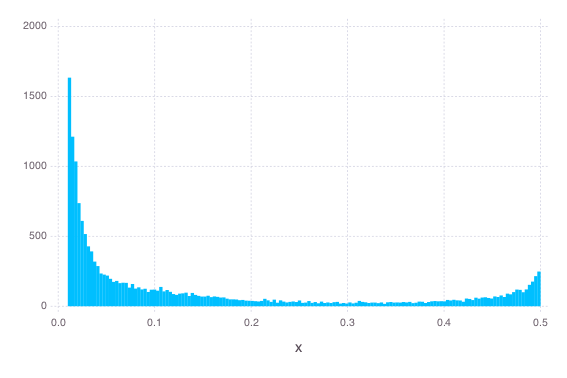

In [22]:
# let's simply draw histogram of MAFs
set_default_plot_size(15cm,10cm)
Gadfly.plot(x = mean(X,1)/2, Geom.histogram)

# can we believe that the MAFs in ancentral population also looks like this?
# I think the answer is fairly positive.

We first make a function to solve a binomial version of ASH. We assume that

$$
\log p(x|\mu,\tau) = \tau x \log \mu + \tau (2-x) \log (1-\mu) + a(x,\tau)
$$

and the distribution has mean $2\mu$ and variance $2\mu(1-\mu)/\tau$.

Suppose we draw independent samples $x_1,\cdots,x_n$ from $\mu_1,\cdots,\mu_n$ and $\tau_1,\cdots,\tau_n$.

Now let

$$
\log p(\mu|\nu,t) = t \nu \log \mu + t (2-\nu) \log (1-\mu) + h(\nu,t)
$$

This is a Beta$(t \nu + 1, t (2-\nu) + 1)$ distribution.

Next, since MAFs can be approximated by a scale mixture of Beta$(2\tau+1,1)$ and Beta$(1,2\tau+1)$ distributions, i.e. $\nu = 0,2$. That is,

$$
\log p(\mu|\phi,t) = \sum_{k=1}^m \left[\phi_k p(\mu|0,t_k) + \phi_{k+m} p(\mu|1,t_k)\right]
$$

can be used to model MAFs in ancestral population.

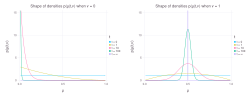

In [23]:
t = [0.001;1;10;100;1e8]; n = 1000
x = linspace(0.01,1-0.01,n+1)

nu = 0; y = pdf.(Beta.(t*nu+1,t*(2-nu)+1),x')';
df = DataFrame(x = repeat(x,outer = length(t)), y = y[:],
               t = repeat(["t = 0";"t = 1";"t = 10";"t = 100";"t = ∞"], inner = n+1))
F1 = Gadfly.plot(df, x = :x, y = :y, color = :t, Geom.line, Coord.Cartesian(ymax = 15),
                 Guide.title("Shape of densities p(μ|t,𝜈) when 𝜈 = 0"), Guide.ylabel("p(μ|t,𝜈)"),
                 Guide.xlabel("μ"))

nu = 1; y = pdf.(Beta.(t*nu+1,t*(2-nu)+1),x')';
df2 = DataFrame(x = repeat(x,outer = length(t)), y = y[:],
                t = repeat(["t = 0";"t = 1";"t = 10";"t = 100";"t = ∞"], inner = n+1))
F2 = Gadfly.plot(df2, x = :x, y = :y, color = :t, Geom.line, Coord.Cartesian(ymax = 15),
                 Guide.title("Shape of densities p(μ|t,𝜈) when 𝜈 = 1"), Guide.ylabel("p(μ|t,𝜈)"),
                 Guide.xlabel("μ"))

set_default_plot_size(25cm,10cm)
Gadfly.hstack(F1,F2)

Note that this fits into the generalized ASH framework that I proposed.

Next, we will make a function to estimate $\mu$ given $x$ and $\tau$ using the likelihood and the prior above, i.e.

$$
\log p(x|\mu,\tau) = \tau x \log \mu + \tau (2-x) \log (1-\mu) + a(x,\tau)
$$

$$
\log p(\mu|\phi,t) = \sum_{k=1}^m \left[\phi_k p(\mu|0,t_k) + \phi_{k+m} p(\mu|1,t_k)\right]
$$

We use a multiplicative grid $t_k = 10^{-5 + k}$ for $k = 1,2,\cdots,9$.

A marginal is

$$
p(x|\phi,t) = \int p(x|\mu,\tau) p(\mu|\phi,t) d\mu =  \sum_{k=1}^m \left[ \phi_{k} \int p(x|\mu,\tau) p(\mu|0,t_k) d\mu + \phi_{k+m} \int p(x|\mu,\tau) p(\mu|1,t_k) d\mu \right]
$$

Suppose $x_1,\cdots,x_n$ are independently drawn from marginal with parameters $\mu_1,\cdots,\mu_n$ and $\tau_1,\cdots,\tau_n$.

First,

$$
H(\nu,t)^{-1} = \exp[-h(\nu,t)] = B(t\nu+1,t(2-\nu) + 1) = \frac{\Gamma(t\nu+1)\Gamma(t(2-\nu)+1}{\Gamma(2t+2)}
$$

A marginal normalizing constant is $H(\tau x + t\nu + 1, \tau (2-x) + t (2-\nu) + 1)^{-1}$ since

$$
\log p(x_j|\mu_j,\tau_j) p(\mu_j|\nu,t_k) = (\tau_j + t_k) \frac{\tau_j x_j}{\tau_j + t_k} \log \mu_j + (\tau_j + t_k) \left( 2 - \frac{\tau_j x_j}{\tau_j + t_k} \right) \log (1-\mu_j) + C''''
$$

Therefore, the problem of maximizing a marginal likelihood $p(x|\phi,t)$ over $\phi$ reduces to the mixsqp problem

$$
\textrm{arg min}_{\phi \in \mathcal{S}} -\frac1n \sum_{j=1}^n \log \sum_{k=1}^{2m} L_{jk} \phi_k
$$

where $S$ is a probability simplex of appropriate dimension and

$$
L_{jk} = B(1,2t+1)^{-1} B(\tau x + 1, \tau (2-x) + 2t + 1),\quad k = 1,\cdots, m \qquad \\
L_{jk} = B(t+1,t+1)^{-1} B(\tau x + t + 1, \tau (2-x) + t + 1),\quad k = m+1,\cdots,2m
$$

Note that we have ignored the same normalizing constant $A(x_j,\tau_j)$ across $j$-th row. It has nothing to do with the objective function in terms of minimization.

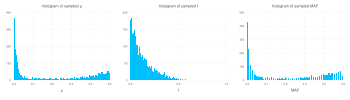

In [24]:
# simulation study
srand(10)

# sample μ from a mixture of Betas
n_div_8 = 500;
μ = [rand.(Beta.(1,50),n_div_8);rand.(Beta.(1,100),2 * n_div_8); rand.(Beta.(1,1),3 * n_div_8);
    rand.(Beta.(15,15),n_div_8);rand.(Beta.(30,30),n_div_8);]
μ[μ .> 0.5] = 1 - μ[μ .> 0.5]; # major allele frequency to minor allele frequency
n = length(μ);

# sample inbreeding coefficient from Betas
f = [rand.(Beta.(1,5),n_div_8*4);rand.(Beta.(1,10),n_div_8*4)];

# sample x from overdispersed Binomial(2,μ) with inbreeding coefficient f
# we sample a n by r matrix by x_{jl} ~ Binomial(2,μ_j) for l = 1,...,r
r = 100;
temp = rand(n,r); x = zeros(n,r)
x[temp .< (1-f).*μ.^2 + f.*μ + 2*(1-f).*μ.*(1-μ)] = 1;
x[temp .< (1-f).*μ.^2 + f.*μ] = 2;

# define mafs and if maf_j > 0.5 then replace it by 1 - maf_j
maf = mean(x,2)/2;
maf[maf .> 0.5] = 1 - maf[maf .> 0.5];

# plot the result
set_default_plot_size(35cm,10cm)
F1 = Gadfly.plot(x = μ, Geom.histogram, Guide.title("histogram of sampled μ"), Guide.xlabel("μ"));
F2 = Gadfly.plot(x = f, Geom.histogram, Guide.title("histogram of sampled f"), Guide.xlabel("f"));
F3 = Gadfly.plot(x = maf, Geom.histogram, Guide.title("histogram of sampled MAF"), Guide.xlabel("MAF"),
                 Coord.Cartesian(xmax = 0.5));
hstack(F1,F2,F3)

In [25]:
# I think we can make a general ash if we specify H or h = log H
# actually we only need to specify h(prior) - h(posterior) or H(prior)/H(posterior)

function h_diff(x,τ,ν,t)
    function B(a,b)
        return lgamma.(a) + lgamma.(b) .- lgamma.(a + b)
    end
    return -B(ν .* t + 1, (2 - ν) .* t + 1)' .+ B(x .* τ .+ (ν .* t)' + 1, (2-x) .* τ .+ ((2-ν) .* t)' + 1)
end

# mixsqp
include("../src/mixsqp.jl")

# ash function
function ash_binomial(x::Array, τ::Array, h_diff::Function;
                      n::Int = length(x), ν::Array = [zeros(7);ones(5)],
                      t::Array = [5.0.^(-3:3);5.0.^(-2:2)])
    
    # contruct a likelihood function
    loglik = h_diff(x,τ,ν,t)
    lik = exp.(loglik .- maximum(loglik,2));
    
    # solve mixsqp
    out = mixsqp(lik, verbose = false)["x"];
    ind = find(out .> 0);
    
    # the posterior is a mixture of Beta distributions
    # Beta(x .* τ .+ (ν .* t)' + 1, (2-x) .* τ .+ ((2-ν) .* t)' + 1)
    
    # component posterior probability
    L = lik[:,ind];
    cpp = L .* out[ind]';
    cpp = cpp ./ sum(cpp,2);
    
    # component posterior mean
    cpm = (x .* τ .+ (ν[ind] .* t[ind])' + 1) ./ (2 * τ .+ 2 * t[ind]' + 2)
    
    # posterior mean
    pm = sum(cpp .* cpm, 2)
    
    
    return Dict([
                (:p, out[ind]), (:L, L), (:ν, ν[ind]), (:t, t[ind]), (:lik, lik),
                (:cpp, cpp), (:cpm, cpm), (:pm, pm)
                ])
end

ash_binomial (generic function with 1 method)

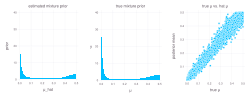

In [32]:
τ = r./(f+1);
out = ash_binomial(2 * maf,τ,h_diff)
μ_hat = linspace(0.0005,1-0.0005,1000)

y = pdf.(Beta.(out[:ν] .* out[:t] + 1, (2-out[:ν]) .* out[:t] + 1), μ_hat')';
y = sum(y .* out[:p]',2);

y2 = [pdf.(Beta.(1,50), μ_hat'); pdf.(Beta.(1,100), μ_hat');
      pdf.(Beta.(1,1), μ_hat'); pdf.(Beta.(15,15), μ_hat'); pdf.(Beta.(30,30), μ_hat')];
y2 = sum(y2 .* [1;2;3;1;1]/8,1)';

# fold the distribution at 0.5
μ_hat = μ_hat[1:500];
y = y[1:500] + y[1001 - (1:500)]
y2 = y2[1:500] + y2[1001 - (1:500)]

# plot the result
set_default_plot_size(25cm,10cm)
F1 = Gadfly.plot(x = μ_hat, y = y, Geom.bar,
                 Guide.title("estimated mixture prior"), Guide.ylabel("prior"),
                 Guide.xlabel("μ_hat"), Coord.Cartesian(ymax = 40))
F2 = Gadfly.plot(x = μ_hat, y = y2, Geom.bar, Guide.title("true mixture prior"),
                 Guide.xlabel("μ"), Coord.Cartesian(ymax = 40));
F3 = Gadfly.plot(x = μ, y = out[:pm], Geom.point, Guide.title("true μ vs. hat μ"),
                 Guide.xlabel("true μ"), Guide.ylabel("posterior mean"), Coord.Cartesian(ymax = 0.5));
F = hstack(F1,F2,F3)